In [18]:
# Импорт библиотек
import numpy as np #для матричных вычислений
import pandas as pd #для анализа и предобработки данных
import matplotlib.pyplot as plt #для визуализации
import seaborn as sns #для визуализации

plt.style.use('seaborn-v0_8') #стиль отрисовки seaborn
sns.set_style("whitegrid")

%matplotlib inline

SEED = 42

# from sklearn import metrics #метрики
# from sklearn import model_selection #методы разделения и валидации
# from sklearn import linear_model #линейные модели
# from sklearn import tree #деревья решений

# from scipy import stats
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# from sklearn.metrics import mean_squared_error, r2_score, make_scorer

# from sklearn.preprocessing import PolynomialFeatures, StandardScaler
# from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet

# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import cross_validate
# from sklearn.pipeline import Pipeline

import sympy

from sympy import (
    Symbol, 
    S,
    simplify, 
    latex,
    sin,
    cos,
    exp,
    log,
    sqrt,
    FiniteSet,
    Union,
    Interval,
    Contains,
    ConditionSet,
    Eq,
    solveset, solve,
    diff,
    limit,
    im,
    N,
    oo
)

from sympy.calculus.util import (
    function_range,
    continuous_domain
)

from scipy.optimize import minimize, least_squares

from IPython.display import display, Markdown

import sys
import os


# Получаем абсолютный путь к директории, где находится ноутбук
notebook_dir = os.path.abspath('')
# Добавляем путь к родительской директории в sys.path
if notebook_dir not in sys.path:
    sys.path.append(notebook_dir)
    
from helper.functionanalyzer import FunctionAnalyzer


sin (x) + 2*x = 0

In [3]:
x = Symbol('x')
f = sin (x) + 2*x 

# Для анализа только в действительных числах
analyzer_real = FunctionAnalyzer(f, x, x_range = (-20, 20), y_range = (-20, 20), complex_domain=False)
analyzer_real.describe()  # 
analyzer_real.plot()


### Анализ функции
#### Функция:
* $f(x) = 2 x + \sin{\left(x \right)}$ 

* $ D(f(x)) : \mathbb{R}$
    
* $ E(f(x)) : \left(-\infty, \infty\right)$

#### Асимптоты:
* асимптот нет
    
* Точки пересечения с осью x: $\left\{x\; \middle|\; x \in \mathbb{R} \wedge 2 x + \sin{\left(x \right)} = 0 \right\}$
    
* Точка пересечения с осью y: $0$

#### Производная функции:

* $f'(x) = \cos{\left(x \right)} + 2$

* $ D(f'(x)) : \mathbb{R}$
    
* $ E(f'(x)) : \left[1, 3\right]$
    
* Точки пересечения с осью x: $\emptyset$
    
* Точка пересечения с осью y: $3$

#### Экстремумы функции:
*    точек экстремума нет

#### Монотонность функции:
*    функция возрастает на всей области определения

#### Вторая производная функции:

* $f''(x) = - \sin{\left(x \right)}$

* $ D(f''(x)) : \mathbb{R}$
    
* $ E(f''(x)) : \left[-1, 1\right]$
    
* Точки пересечения с осью x: $\left\{2 n \pi\; \middle|\; n \in \mathbb{Z}\right\} \cup \left\{2 n \pi + \pi\; \middle|\; n \in \mathbb{Z}\right\}$
    
* Точка пересечения с осью y: $0$
    
#### Проверка функции на четность:

* $f(-x) = - 2 x - \sin{\left(x \right)}$
    
* $f(x) = 2 x + \sin{\left(x \right)}$

* Функция нечетная.
    
#### Проверка функции на выпуклость:
*    функция линейна

#### Особые точки функции:
*    x = 0.0 (точка перегиба)
   * x = 3.141592653589793 ()


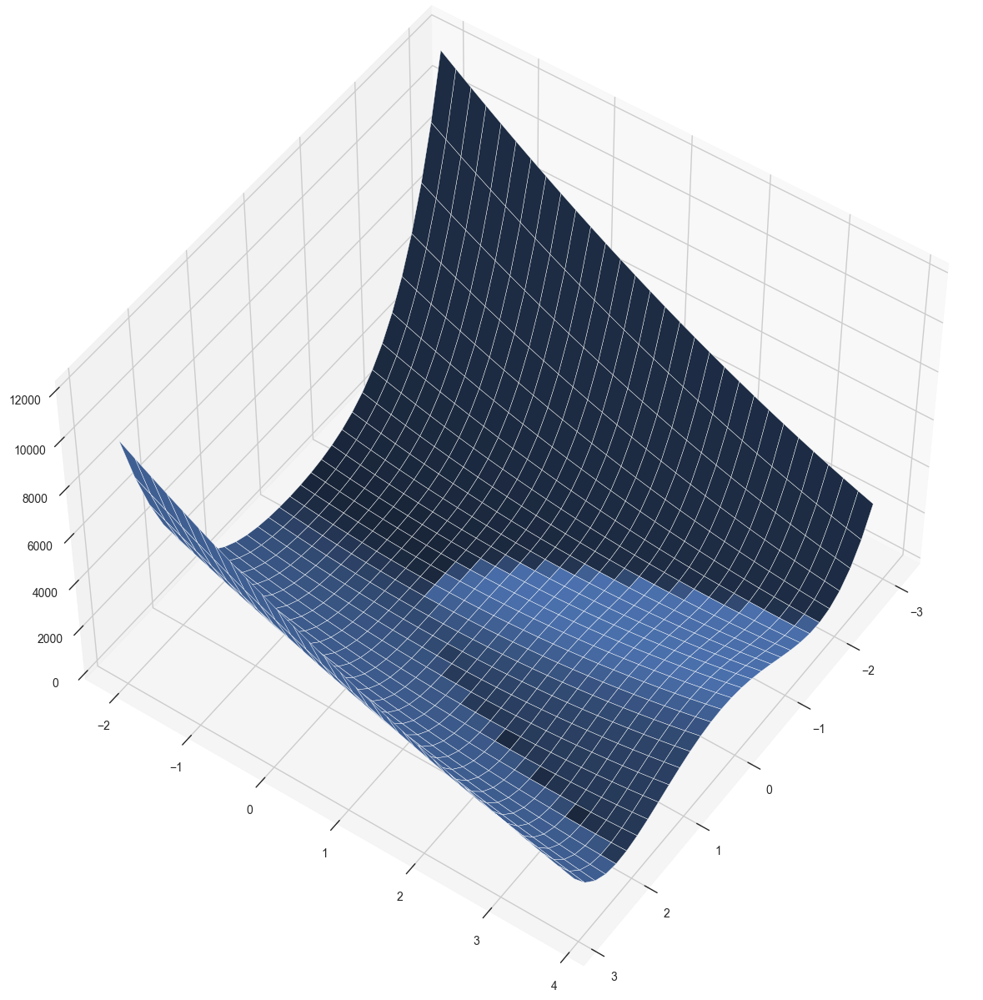

In [9]:

# Функция Розен брока
def func_rosen(x):
    r = np.sum(100*(x[1:]-x[:-1]**2)**2 + (1-x[:-1])**2, axis=0)
    return r


graph = plt.figure(figsize=[25, 15])
ax = graph.add_subplot(projection='3d')
ax.view_init(50, 35)
x1 = np.arange(-3, 3, 0.2)
x2 = np.arange(-2, 4, 0.2)
x1, x2 = np.meshgrid(x1, x2)
y = func_rosen(np.array([x1,x2]))
surf = ax.plot_surface(x1, x2, y)
plt.show()

Теперь, когда нам доступно визуальное представление функции, давайте попробуем её оптимизировать. Начнём с простых методов.

Алгоритмом оптимизации, в котором вычисляются только значения функций, является метод Пауэлла. Чтобы использовать его, необходимо установить method = 'powell' в функции minim.

→ Мы выбрали данный метод потому, что он является самым простым из возможных в плане реализации и используемых вычислений. В следующем модуле мы комплексно рассмотрим все методы и поговорим о том, как выбрать нужный.

In [10]:
from scipy.optimize import minimize
x1 = np.array([2.4, 1.5, 2.1, 0.7, 1.1])
result_point = minimize(func_rosen, x1, method='powell')
print(result_point.x)

[1. 1. 1. 1. 1.]


Итак, мы нашли точку минимума одним из методов. Теперь давайте используем для этого другой алгоритм.

Допустим, у нас есть некоторая точка x0 в пятимерном пространстве. Найдём ближайшую к ней точку минимума функции Розенброка, используя алгоритм метода Нелдера — Мида (также его называют симплекс-методом):

In [11]:
from scipy.optimize import minimize
x1 = np.array([2.4, 1.5, 2.1, 0.7, 1.1])
result_point = minimize(func_rosen, x1, method='nelder-mead')
print(result_point.x)

[1.02760651 1.05589639 1.11509457 1.2440091  1.54862169]


Найденная точка следующая (заметьте, что результаты отличаются от полученных предыдущим методом, но это нормально):



### Задание 4.5

5 points possible (graded)

Оптимизируйте функцию Розенброка с помощью уже известного вам метода наименьших квадратов с использованием той же точки, которая фигурировала в наших решениях до этого.

Для реализации этого алгоритма используется функция least_squares.

In [16]:
from scipy.optimize import least_squares

x1 = np.array([2.4, 1.5, 2.1, 0.7, 1.1])
result = least_squares(func_rosen, x1)

# Вариант 1: форматирование каждого элемента массива
print(f"Решение: [{', '.join([f'{x:.3f}' for x in result.x])}]")

# Вариант 2: использование numpy.array2string
print(f"Решение: {np.array2string(result.x, precision=3, separator=', ')}")

# Остальной вывод без изменений
print(f"Успех оптимизации: {result.success}")
print(f"Статус: {result.status}")
print(f"Сообщение: {result.message}")
print(f"Количество итераций: {result.nfev}")
print(f"Невязки: {np.array2string(result.fun, precision=3, separator=', ')}")

Решение: [0.939, 0.882, 0.776, 0.603, 0.361]
Решение: [0.939, 0.882, 0.776, 0.603, 0.361]
Успех оптимизации: False
Статус: 0
Сообщение: The maximum number of function evaluations is exceeded.
Количество итераций: 500
Невязки: [0.226]


### Задание 5.1

2 points possible (graded)

Найдите экстремумы функции $f(x,y) = 4x + 3y$ на множестве, заданном уравнением $x^2 + y^2 = 1$.

В качестве ответа впишите значения функции в точках максимума и минимума.

In [22]:
# Используем метод Лагранжа
x = Symbol('x')
y = Symbol("y")
lambda_var = Symbol("lambda") 

f = 4*x + 3*y
g = x**2 + y**2 
c = 1

L = f + lambda_var * (g - c)

L_diff_x = diff(L, x)
L_diff_y = diff(L, y)
L_diff_lambda = diff(L, lambda_var)

sol = solve([L_diff_x, L_diff_y, L_diff_lambda], [x, y, lambda_var])

f_list = {}

# найдём значения целевой функции L в найденных точках:
for x_val, y_val, lambda_val in sol:
    f_val = f.subs({x: x_val, y: y_val})
    f_list[f"{x_val}, {y_val}"] = f_val

# поиск минимума и максимума    
min_f = min(f_list.values())
max_f = max(f_list.values())

# найдём точки максимума и минимума
max_point = max(f_list, key=f_list.get)
min_point = min(f_list, key=f_list.get)

print(f"Значение функции в точке максимума: {max_f}")
print(f"Точка максимума: {max_point}")

print(f"Значение функции в точке минимума: {min_f}")
print(f"Точка минимума: {min_point}")


Значение функции в точке максимума: 5
Точка максимума: 4/5, 3/5
Значение функции в точке минимума: -5
Точка минимума: -4/5, -3/5


### Пример № 3

У нас есть два станка для производства пластиковых упаковок. Станки разных моделей, поэтому при их использовании получаются разные издержки, зависящие от произведённых упаковок и выражаемые следующими функциями:

g(a)=3a^2+a

g(b)=4b+5b^2

Здесь a — это количество упаковок, произведённых на первом станке, а b — количество упаковок, произведённых на втором станке.

Нам заказали 200 упаковок. Мы хотим выполнить заказ, минимизировав расходы на изготовление товаров. Чтобы узнать, как мы можем сэкономить, необходимо решить задачу оптимизации.

In [23]:
from sympy import *
a,b,w=symbols(' a b w' )
g = 3*a**2 + a + 4*b + 5*b**2
print('Целевая функция для аргументов a и b :\n f = ', g)
q = a + b - 200
print('Функция ограничений: ', q,'= 0')
f = 3*a**2 + a + 4*b + 5*b**2 + w*(a + b - 200)
print('Функция Лагранжа :\n ',f)
fa = f.diff(a)
print('df/da =',fa,'= 0')
fb = f.diff(b)
print('df/db =',fb,'= 0')
fw = f.diff(w)
print('df/dw =',fw,'= 0')
sols = solve([fa,fb,fw],a,b,w)
print('Стационарная точка M(x,y):\n',float(sols[a]),',',float(sols[b]))

#Целевая функция для аргументов a и b :
#f =  3*a**2 + a + 5*b**2 + 4*b
#Функция ограничений:  a + b - 200 = 0
#Функция Лагранжа :
#3*a**2 + a + 5*b**2 + 4*b + w*(a + b - 200)
#df/da = 6*a + w + 1 = 0
#df/db = 10*b + w + 4 = 0
#df/dw = a + b - 200 = 0
#Стационарная точка M(x,y):
#125.1875 , 74.8125

Целевая функция для аргументов a и b :
 f =  3*a**2 + a + 5*b**2 + 4*b
Функция ограничений:  a + b - 200 = 0
Функция Лагранжа :
  3*a**2 + a + 5*b**2 + 4*b + w*(a + b - 200)
df/da = 6*a + w + 1 = 0
df/db = 10*b + w + 4 = 0
df/dw = a + b - 200 = 0
Стационарная точка M(x,y):
 125.1875 , 74.8125


### Задание 5.3

1 point possible (graded)

Представьте, что вы решаете задачу классификации методом опорных векторов и хотите оценить расстояние от объекта до разделяющей прямой с помощью метода Лагранжа. Если объект имеет координаты  (2;1) , а прямая задана уравнением  x+y=1 , то каким будет квадрат расстояния от этого объекта до прямой?

Подсказка (1 из 1): Чтобы найти расстояние от точки  x0  до прямой, необходимо найти на прямой такую точку  x , чтобы расстояние от  x0  до  x  было минимальным.

In [28]:
from sympy import symbols, solve, diff

# 1. Определяем символьные переменные
x, y, w = symbols('x y w') # Используем 'w' как множитель Лагранжа, как в примере

# 2. Задаем координаты точки
x0, y0 = 2, 1

# 3. Определяем целевую функцию (квадрат расстояния)
# f(x, y) = (x - x0)^2 + (y - y0)^2
f = (x - x0)**2 + (y - y0)**2
print(f'Целевая функция (квадрат расстояния):\n f = {f}')

# 4. Определяем функцию ограничений (уравнение прямой в виде g(x,y)=0)
# q(x, y) = x + y - 1
q = x + y - 1
print(f'Функция ограничений: {q} = 0')

# 5. Строим функцию Лагранжа L = f + w*q
L = f + w * q
print(f'Функция Лагранжа:\n L = {L}')

# 6. Находим частные производные
Lx = diff(L, x)
Ly = diff(L, y)
Lw = diff(L, w) # Должна совпасть с функцией ограничений q

print(f'dL/dx = {Lx} = 0')
print(f'dL/dy = {Ly} = 0')
print(f'dL/dw = {Lw} = 0')

# 7. Решаем систему уравнений Lx=0, Ly=0, Lw=0
sols = solve([Lx, Ly, Lw], (x, y, w))
print(f'Решение системы (x, y, w): {sols}')

# 8. Извлекаем координаты x и y точки на прямой, ближайшей к (x0, y0)
closest_x = sols[x]
closest_y = sols[y]
print(f'Координаты ближайшей точки на прямой: ({closest_x}, {closest_y})')

# 9. Вычисляем квадрат расстояния, подставляя найденные x и y
# в исходную целевую функцию f
squared_distance = f.subs({x: closest_x, y: closest_y})
print(f'\nКвадрат расстояния от точки ({x0}, {y0}) до прямой: {squared_distance}')

# Преобразуем результат в число для ясности
print(f'Квадрат расстояния (числовое значение): {float(squared_distance)}')

Целевая функция (квадрат расстояния):
 f = (x - 2)**2 + (y - 1)**2
Функция ограничений: x + y - 1 = 0
Функция Лагранжа:
 L = w*(x + y - 1) + (x - 2)**2 + (y - 1)**2
dL/dx = w + 2*x - 4 = 0
dL/dy = w + 2*y - 2 = 0
dL/dw = x + y - 1 = 0
Решение системы (x, y, w): {w: 2, x: 1, y: 0}
Координаты ближайшей точки на прямой: (1, 0)

Квадрат расстояния от точки (2, 1) до прямой: 2
Квадрат расстояния (числовое значение): 2.0


### Задание 5.4

1 point possible (graded)

Прямоугольный параллелепипед имеет объём  1 м3 . Чему равна минимальная площадь его поверхности?

Прекрасно! Давайте решим задачу о минимизации площади поверхности прямоугольного параллелепипеда с фиксированным объемом, используя метод Лагранжа, как мы делали ранее.

**1. Постановка задачи:**

*   **Переменные:** Пусть размеры прямоугольного параллелепипеда будут x, y и z (длина, ширина, высота).
*   **Ограничение (объем):** Объем параллелепипеда должен быть равен 1 м³.  
$V = x * y * z = 1$.
*   **Целевая функция (площадь поверхности для минимизации):**  $S = 2(xy + xz + yz)$. Мы хотим минимизировать S при условии $V = 1$.

**2. Метод Лагранжа:**

*   Составляем функцию Лагранжа $L(x, y, z, w)$, где w - множитель Лагранжа:

    $L(x, y, z, w) = S + w * (V - 1)$  (мы вычитаем 1, чтобы ограничение было в форме g = 0)

    $L(x, y, z, w) = 2(xy + xz + yz) + w * (xyz - 1)$

*   Находим частные производные функции Лагранжа и приравниваем их к нулю:
    *   $∂L/∂x = 2(y + z) + w * yz = 0$
    *   $∂L/∂y = 2(x + z) + w * xz = 0$
    *   $∂L/∂z = 2(x + y) + w * xy = 0$
    *   $∂L/∂w = xyz - 1 = 0$ (это наше ограничение)


**Ответ:** Минимальная площадь поверхности прямоугольного параллелепипеда объемом 1 м³ равна 6 м².  Как и ожидалось, минимальная площадь поверхности достигается, когда параллелепипед является кубом $(x = y = z = 1)$.

**3. Реализация на Python с использованием SymPy:**

In [31]:
from sympy import symbols, solve, diff

# 1. Определяем символьные переменные
x, y, z, w = symbols('x y z w')

# 2. Определяем функцию объема (ограничение) в виде q = V - 1 = 0
q = x * y * z - 1
print(f'Функция ограничений (объем = 1):\n q = {q} = 0')

# 3. Определяем целевую функцию (площадь поверхности)
f = 2 * (x * y + x * z + y * z)
print(f'Целевая функция (площадь поверхности):\n f = {f}')

# 4. Строим функцию Лагранжа L = f + w*q
L = f + w * q
print(f'Функция Лагранжа:\n L = {L}')

# 5. Находим частные производные
Lx = diff(L, x)
Ly = diff(L, y)
Lz = diff(L, z)
Lw = diff(L, w)

print(f'dL/dx = {Lx} = 0')
print(f'dL/dy = {Ly} = 0')
print(f'dL/dz = {Lz} = 0')
print(f'dL/dw = {Lw} = 0')

# 6. Решаем систему уравнений Lx=0, Ly=0, Lz=0, Lw=0
# Важно указать переменные для решения в нужном порядке
variables_to_solve = (x, y, z, w)
sols = solve([Lx, Ly, Lz, Lw], variables_to_solve)
print(f'Решение системы {variables_to_solve}: {sols}') # Посмотрим на формат вывода

# 7. Извлекаем значения x, y, z, соответствующие минимальной площади поверхности
# Проверяем формат вывода sols. Если это список кортежей:
if isinstance(sols, list) and len(sols) > 0 and isinstance(sols[0], tuple):
    print("Обнаружен формат вывода: список кортежей.")
    solution_tuple = sols[0]
    optimal_x = solution_tuple[variables_to_solve.index(x)] # Находим индекс x в кортеже variables_to_solve
    optimal_y = solution_tuple[variables_to_solve.index(y)] # Находим индекс y
    optimal_z = solution_tuple[variables_to_solve.index(z)] # Находим индекс z
# Иначе, если это список словарей (как ожидалось ранее):
elif isinstance(sols, list) and len(sols) > 0 and isinstance(sols[0], dict):
    print("Обнаружен формат вывода: список словарей.")
    solution_dict = sols[0]
    optimal_x = solution_dict[x]
    optimal_y = solution_dict[y]
    optimal_z = solution_dict[z]
# Иначе, если это просто словарь:
elif isinstance(sols, dict):
     print("Обнаружен формат вывода: словарь.")
     optimal_x = sols[x]
     optimal_y = sols[y]
     optimal_z = sols[z]
else:
    print(f"Неожиданный формат решения: {sols}")
    # Устанавливаем значения по умолчанию или вызываем ошибку, если решение не найдено
    optimal_x, optimal_y, optimal_z = None, None, None # Пример

# Убедимся, что значения были найдены перед продолжением
if optimal_x is not None:
    print(f'Оптимальные размеры параллелепипеда: x = {optimal_x}, y = {optimal_y}, z = {optimal_z}')

    # 8. Вычисляем минимальную площадь поверхности, подставляя найденные x, y, z в f
    min_surface_area = f.subs({x: optimal_x, y: optimal_y, z: optimal_z})
    print(f'\nМинимальная площадь поверхности: {min_surface_area}')

    # Преобразуем результат в число для ясности
    print(f'Минимальная площадь поверхности (числовое значение): {float(min_surface_area)}')
else:
    print("Не удалось извлечь оптимальные размеры.")

Функция ограничений (объем = 1):
 q = x*y*z - 1 = 0
Целевая функция (площадь поверхности):
 f = 2*x*y + 2*x*z + 2*y*z
Функция Лагранжа:
 L = w*(x*y*z - 1) + 2*x*y + 2*x*z + 2*y*z
dL/dx = w*y*z + 2*y + 2*z = 0
dL/dy = w*x*z + 2*x + 2*z = 0
dL/dz = w*x*y + 2*x + 2*y = 0
dL/dw = x*y*z - 1 = 0
Решение системы (x, y, z, w): [(1, 1, 1, -4), (-1/2 - sqrt(3)*I/2, -1/2 - sqrt(3)*I/2, -1/2 - sqrt(3)*I/2, 2 - 2*sqrt(3)*I), (-1/2 + sqrt(3)*I/2, -1/2 + sqrt(3)*I/2, -1/2 + sqrt(3)*I/2, 2 + 2*sqrt(3)*I)]
Обнаружен формат вывода: список кортежей.
Оптимальные размеры параллелепипеда: x = 1, y = 1, z = 1

Минимальная площадь поверхности: 6
Минимальная площадь поверхности (числовое значение): 6.0


### Рассмотрим решение задачи с таким ограничением на примере ↓


Длина забора — 20 метров. Какова максимальная площадь прямоугольного участка, который можно огородить? Хотя бы одна из сторон прямоугольника должна быть не меньше 6.



In [34]:
# Импортируем все необходимые функции из библиотеки SymPy
from sympy import init_printing, solve, symbols

# Подключаем аккуратный вывод формул
init_printing()

# Создаём переменные
x1, x2, x1_tilde, lambda1, lambda2 = symbols(
    "x_1 x_2 xtilde_2 \lambda_1 \lambda_2", real=True
)


# 2а. Определяем 1 функцию ограничения полупериметра
q1 = x1 + x2 - 10
print(f'Функция ограничений :\n q_1 = {q1} = 0')

# 2б. Определяем 2 функцию ограничения длины одной из сторон
q2 = -x1 + 6 + x1_tilde**2
print(f'Функция ограничений :\n q_2 = {q2} = 0')

# 3. Определяем целевую функцию (площадь прямоугольного участка)
f = x1 * x2
print(f'Целевая функция (площадь прямоугольного участка):\n f = {f}')

# 4. Строим функцию Лагранжа L = f + lambda1 * q1 + lambda2 * q2
L = f + lambda1 * q1 + lambda2 * q2
print(f'Функция Лагранжа:\n L = {L}')


# Пишем систему уравнений для переменных
# dLdx1 = -x2 + lambda1 - lambda2
# dLdx2 = -x1 + lambda1
# dLdx1_tilde = 2 * lambda2 * x1_tilde
# dLdlambda1 = x1 + x2 - 10
# dLdlambda2 = -x1 + 6 + x1_tilde**2

dLdx1 = diff(L, x1)
dLdx2 = diff(L, x2)
dLdx1_tilde = diff(L, x1_tilde)
dLdlambda1 = diff(L, lambda1)
dLdlambda2 = diff(L, lambda2)


# Решаем систему уравнений с помощью функции solve
# solution = solve(
#     [dLdx1, dLdx2, dLdx1_tilde, dLdlambda1, dLdlambda2],
#     x1,
#     x2,
#     x1_tilde,
#     lambda1,
#     lambda2,
# )

#print(solution)

# 6. Решаем систему уравнений Lx=0, Ly=0, Lz=0, Lw=0
# Важно указать переменные для решения в нужном порядке

variables_to_solve = (x1, x2, x1_tilde, lambda1, lambda2)
sols = solve([dLdx1, dLdx2, dLdx1_tilde, dLdlambda1, dLdlambda2], variables_to_solve)
print(f'Решение системы {variables_to_solve}: {sols}')

# Обработка решения
if isinstance(sols, list) and len(sols) > 0 and isinstance(sols[0], tuple):
    print("Обнаружен формат вывода: список кортежей.")
    solution_tuple = sols[0]
    optimal_x1 = solution_tuple[variables_to_solve.index(x1)]
    optimal_x2 = solution_tuple[variables_to_solve.index(x2)]
    optimal_x1_tilde = solution_tuple[variables_to_solve.index(x1_tilde)]
elif isinstance(sols, list) and len(sols) > 0 and isinstance(sols[0], dict):
    print("Обнаружен формат вывода: список словарей.")
    solution_dict = sols[0]
    optimal_x1 = solution_dict[x1]
    optimal_x2 = solution_dict[x2]
    optimal_x1_tilde = solution_dict[x1_tilde]
elif isinstance(sols, dict):
    print("Обнаружен формат вывода: словарь.")
    optimal_x1 = sols[x1]
    optimal_x2 = sols[x2]
    optimal_x1_tilde = sols[x1_tilde]
else:
    print(f"Неожиданный формат решения: {sols}")
    optimal_x1, optimal_x2, optimal_x1_tilde = None, None, None

# Вывод результатов
if optimal_x1 is not None:
    print(f'Оптимальные значения:')
    print(f'x₁ = {optimal_x1}')
    print(f'x₂ = {optimal_x2}')
    print(f'x₁_tilde = {optimal_x1_tilde}')

    # Вычисляем значение целевой функции
    min_area = f.subs({x1: optimal_x1, x2: optimal_x2})
    print(f'\nМинимальная площадь: {min_area}')
    
    # Преобразуем результат в число для ясности
    try:
        print(f'Минимальная площадь (числовое значение): {float(min_area)}')
    except:
        print('Не удалось преобразовать площадь в числовое значение')
else:
    print("Не удалось извлечь оптимальные значения.")

Функция ограничений :
 q_1 = x_1 + x_2 - 10 = 0
Функция ограничений :
 q_2 = -x_1 + xtilde_2**2 + 6 = 0
Целевая функция (площадь прямоугольного участка):
 f = x_1*x_2
Функция Лагранжа:
 L = \lambda_1*(x_1 + x_2 - 10) + \lambda_2*(-x_1 + xtilde_2**2 + 6) + x_1*x_2
Решение системы (x_1, x_2, xtilde_2, \lambda_1, \lambda_2): [(6, 4, 0, -6, -2)]
Обнаружен формат вывода: список кортежей.
Оптимальные значения:
x₁ = 6
x₂ = 4
x₁_tilde = 0

Минимальная площадь: 24
Минимальная площадь (числовое значение): 24.0


### Задание 5.6

1/1 point (graded)

Сколько переменных будет у функции Лагранжа задачи  

min   $x^2+2xy+y^2$  

при условии  
$5≤x≤8$; 

$x+y=2$ ?

Существует метод решения задач с неравенствами, который включает введение **слабых (или дополнительных) переменных** (slack/surplus variables), чтобы превратить неравенства в равенства. Давайте рассмотрим этот подход.

**1. Преобразование неравенств в равенства:**

*   $5 \le x$ можно переписать как $x - 5 \ge 0$. Вводим слабую переменную $s_1 \ge 0$:
    $x - 5 - s_1 = 0$
*   $x \le 8$ можно переписать как $8 - x \ge 0$. Вводим слабую переменную $s_2 \ge 0$:
    $8 - x - s_2 = 0$

**2. Новая формулировка задачи:**

Теперь задача выглядит так:

min $x^2+2xy+y^2$

при условиях:
*   $x + y - 2 = 0$
*   $x - 5 - s_1 = 0$
*   $8 - x - s_2 = 0$
*   $s_1 \ge 0$
*   $s_2 \ge 0$

**3. Формирование функции Лагранжа (для равенств):**

Теперь мы формируем функцию Лагранжа для минимизации исходной функции при условиях-*равенствах*. Условия $s_1 \ge 0$ и $s_2 \ge 0$ обычно учитываются отдельно (в рамках условий Каруша-Куна-Таккера или при анализе решения), но сами *переменные* $s_1$ и $s_2$ входят в Лагранжиан.

Функция Лагранжа $\mathcal{L}'$ будет зависеть от:

*   **Исходных переменных:** $x, y$ (2)
*   **Слабых переменных:** $s_1, s_2$ (2)
*   **Множителей Лагранжа для каждого равенства:** $\lambda_1, \lambda_2, \lambda_3$ (3)

$\mathcal{L}'(x, y, s_1, s_2, \lambda_1, \lambda_2, \lambda_3) = (x^2 + 2xy + y^2) + \lambda_1(x + y - 2) + \lambda_2(x - 5 - s_1) + \lambda_3(8 - x - s_2)$

**4. Подсчет переменных:**

Общее количество переменных в этой функции Лагранжа $\mathcal{L}'$:
2 (исходные) + 2 (слабые) + 3 (множители) = 7 переменных.

**Вывод:**

Если использовать метод с введением слабых переменных для преобразования неравенств в равенства *перед* построением функции Лагранжа, то у такой функции Лагранжа будет **7 переменных**: $x, y, s_1, s_2, \lambda_1, \lambda_2, \lambda_3$.

Спасибо за уточнение! Мой предыдущий ответ основывался на стандартном подходе к построению Лагранжиана для задач с неравенствами (используя множители $\mu_i$ напрямую для неравенств), который приводит к 5 переменным. Ваш подход с предварительным введением слабых переменных является альтернативным и приводит к 7 переменным в Лагранжиане.

### Задание 6.5

4 points possible (graded)

$f(a,b) = (5 − a − 2b)^2$

1. Вычислите $\overrightarrow{grad} f|_{M(1,1)}$:

In [39]:
a = Symbol('a')
b = Symbol('b')

f = (5 - a - 2*b)**2

grad_f = (diff(f, a), diff(f, b))

print(grad_f)

# Вычисляем значение градиента в точке (1,1)
grad_f_value = (grad_f[0].subs({a: 1, b: 1}), grad_f[1].subs({a: 1, b: 1}))

display(Markdown(f"""
### Функция $f(x) = {latex(f)}$

### Градиент: $grad f(x) = ({latex(grad_f[0])}, {latex(grad_f[1])})$

### Значение градиента в точке $M(1,1)$: $({latex(grad_f_value[0])}, {latex(grad_f_value[1])})$
"""))



(2*a + 4*b - 10, 4*a + 8*b - 20)



### Функция $f(x) = \left(- a - 2 b + 5\right)^{2}$

### Градиент: $grad f(x) = (2 a + 4 b - 10, 4 a + 8 b - 20)$

### Значение градиента в точке $M(1,1)$: $(-4, -8)$


2. Сколько решений имеет СЛАУ $\overrightarrow{grad} f = \overrightarrow{0}$?

In [58]:
from sympy import Symbol, diff, Matrix, latex
from IPython.display import display, Markdown

a = Symbol('a')
b = Symbol('b')

f = (5 - a - 2*b)**2

# Создаем вектор переменных и вычисляем градиент как вектор
vars = Matrix([a, b])
grad_f = Matrix([diff(f, var) for var in vars])

#print(grad_f)

# Вычисляем значение градиента в точке (1,1)
grad_f_value = grad_f.subs({a: 1, b: 1})

display(Markdown(f"""
### Функция $f(x) = {latex(f)}$

### Градиент: $grad f(x) = {latex(grad_f)}$

### Значение градиента в точке $M(1,1)$: ${latex(grad_f_value)}$
"""))

# Приравниваем градиент к нулю и решаем систему
equations = [grad_f[0], grad_f[1]]
solution = solve(equations, [a, b])

# display(Markdown(f"""
# ### Система уравнений:
# $\\begin{{cases}}
# {latex(grad_f[0])} = 0 \\\\
# {latex(grad_f[1])} = 0
# \\end{{cases}}$

# ### Решение:
# Система имеет {len(solution) if isinstance(solution, list) else '∞'} {'решение' if len(solution) == 1 else 'решений' if isinstance(solution, list) else 'решений'}

# {latex(solution) if solution else 'Нет решений'}
# """))

# # Проверяем, что решения действительно обращают градиент в ноль
# if isinstance(solution, list) and len(solution) > 0:
#     verification = grad_f.subs([(a, solution[0][0]), (b, solution[0][1])])
#     display(Markdown(f"""
# ### Проверка (подставляем решение обратно в градиент):
# ${latex(verification)} = \\vec{{0}}$
# """))
    
# Анализируем тип решения
if isinstance(solution, dict):
    # Случай с бесконечным числом решений
    solution_text = "бесконечно много решений\n\n"
    solution_text += f"$a = {latex(solution[a])}$, где $b \\in \\mathbb{{R}}$"
elif isinstance(solution, list):
    if len(solution) == 0:
        solution_text = "нет решений"
    elif len(solution) == 1:
        solution_text = f"одно решение:\n\n$a = {latex(solution[0][0])}$, $b = {latex(solution[0][1])}$"
    else:
        solution_text = f"{len(solution)} решения:\n\n"
        for i, sol in enumerate(solution, 1):
            solution_text += f"${i})\\  a = {latex(sol[0])},\\ b = {latex(sol[1])}$\n\n"
else:
    solution_text = "невозможно определить количество решений"

display(Markdown(f"""
### Система уравнений:
$\\begin{{cases}}
{latex(grad_f[0])} = 0 \\\\
{latex(grad_f[1])} = 0
\\end{{cases}}$

### Решение:
Система имеет {solution_text}
***
"""))

# Нужно проверить эти точки, подходят ли они для решения уравнения
# A  (1,2) 
# B  (1,3) 
# C  (0,0) 
# D  (5,0)

points = [(1,2), (1,3), (0,0), (5,0)]

display(Markdown("### Проверка точек:"))

for point in points:
    x, y = point
    grad_value = grad_f.subs({a: x, b: y})
    is_solution = grad_value[0] == 0 and grad_value[1] == 0
    
    display(Markdown(f"""
Точка $({x}, {y})$:
- Значение градиента: ${latex(grad_value)}$
- {'✓ Является решением' if is_solution else '✗ Не является решением'}
"""))




### Функция $f(x) = \left(- a - 2 b + 5\right)^{2}$

### Градиент: $grad f(x) = \left[\begin{matrix}2 a + 4 b - 10\\4 a + 8 b - 20\end{matrix}\right]$

### Значение градиента в точке $M(1,1)$: $\left[\begin{matrix}-4\\-8\end{matrix}\right]$



### Система уравнений:
$\begin{cases}
2 a + 4 b - 10 = 0 \\
4 a + 8 b - 20 = 0
\end{cases}$

### Решение:
Система имеет бесконечно много решений

$a = 5 - 2 b$, где $b \in \mathbb{R}$
***


### Проверка точек:


Точка $(1, 2)$:
- Значение градиента: $\left[\begin{matrix}0\\0\end{matrix}\right]$
- ✓ Является решением



Точка $(1, 3)$:
- Значение градиента: $\left[\begin{matrix}4\\8\end{matrix}\right]$
- ✗ Не является решением



Точка $(0, 0)$:
- Значение градиента: $\left[\begin{matrix}-10\\-20\end{matrix}\right]$
- ✗ Не является решением



Точка $(5, 0)$:
- Значение градиента: $\left[\begin{matrix}0\\0\end{matrix}\right]$
- ✓ Является решением


### Задание 6.6
3 points possible (graded)

L2-loss функция имеет вид 
$L = (2.1 − w_0 − w_1)^2 +(2.9 − w_0 − 3w_1)^2 +(4.1 − w_0 − 5w_1)^2$


1. Сколько решений имеет СЛАУ $\overrightarrow{grad} L = \overrightarrow{0}$?

In [63]:
w0 = Symbol('w0')
w1 = Symbol('w1')

f = (2.1 - w0 - w1)**2 + (2.9 - w0 - 3*w1)**2 + (4.1 - w0 - 5*w1)**2

# Создаем вектор переменных и вычисляем градиент как вектор
vars = Matrix([w0, w1])
grad_f = Matrix([diff(f, var) for var in vars])

#print(grad_f)

# Вычисляем значение градиента в точке (1,1)
grad_f_value = grad_f.subs({w0: 1, w1: 1})

display(Markdown(f"""
### Функция $f(x) = {latex(f)}$

### Градиент: $grad f(x) = {latex(grad_f)}$

"""))

# Приравниваем градиент к нулю и решаем систему
equations = [grad_f[0], grad_f[1]]
solution = solve(equations, [w0, w1])

display(Markdown(f"""

### Решение: $grad f(x)= 0 : {latex(solution)}$

"""))




### Функция $f(x) = 4.41 \left(- 0.476190476190476 w_{0} - 0.476190476190476 w_{1} + 1\right)^{2} + 9 \left(- \frac{w_{0}}{3} - w_{1} + 0.966666666666667\right)^{2} + 25 \left(- \frac{w_{0}}{5} - w_{1} + 0.82\right)^{2}$

### Градиент: $grad f(x) = \left[\begin{matrix}6.0 w_{0} + 18.0 w_{1} - 18.2\\18.0 w_{0} + 70.0 w_{1} - 62.6\end{matrix}\right]$





### Решение: $grad f(x)= 0 : \left\{ w_{0} : 1.53333333333333, \  w_{1} : 0.5\right\}$



### Задание 6.7

1 point possible (graded)

Пусть дан одномерный массив f = np.array([8, 2, 8, 3, 5, 6, 5, 15]).

Вычислите градиент массива  f , увеличив шаг сетки в семь раз, и укажите значение седьмого элемента массива получившихся градиентов  f  (порядок элементов начинается с 0).

In [65]:
f = np.array([8, 2, 8, 3, 5, 6, 5, 15])

grad_f = np.gradient(f, 7)

print(grad_f)

print(grad_f[7])
# [-0.85714286  0.          0.07142857 -0.21428571  0.21428571  0.
#   0.64285714  1.42857143]
# 1.4285714285714286

[-0.85714286  0.          0.07142857 -0.21428571  0.21428571  0.
  0.64285714  1.42857143]
1.4285714285714286


Теперь давайте рассмотрим визуализацию данного процесса. Определим простейшую выпуклую функцию. В ней нет ничего особенного, но она очень удобна в визуальном плане:

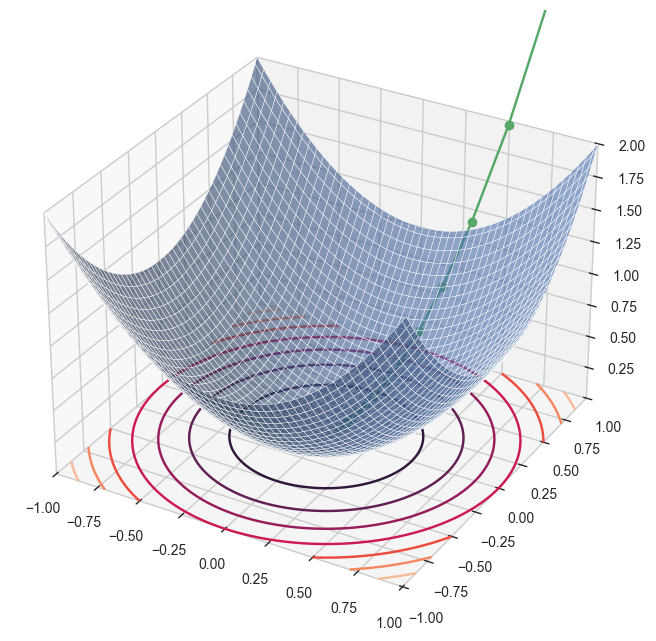

In [68]:
def fun(x, y, a=1, b=1):
    return a * (x ** 2) + b * (y ** 2)

# Определим функцию, которая вычислит градиент:
def grad(x, y, a=1, b=1):
    return np.array([2 * a * x, 2 * b * y])

# Также запрограммируем простейший вариант для градиентного спуска:
def grad_descend(grad, step_size=0.2, num_steps=30):
    lst = []
    x = np.random.uniform(0, 5, size = 2)
    lst.append(x)
    for i in range(num_steps):
        x = x - step_size * grad(lst[-1][0], lst[-1][1])
        lst.append(x)
    return np.array(lst)

# Напишем функцию, которая будет строить график:
def plot_grad(fun, trace):
    fig = plt.figure(figsize=(10, 8))
    x_ = np.linspace(-1, 1, 100)
    y_ = np.linspace(-1, 1, 100)
    x, y = np.meshgrid(x_, y_)
    z = fun(x, y)
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    ax.plot_surface(x, y, z, alpha=0.6)
    ax.contour(x, y, z, zdir='z', offset=z.min())
    z_trace = fun(trace[:, 0], trace[:, 1])
    ax.plot(trace[:, 0], trace[:, 1], z_trace, "o-")
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.set_zlim(z.min(), z.max())

# Визуализируем и получим следующее движение градиентного спуска к минимуму:
trace = grad_descend(grad, 0.1, 20)
plot_grad(fun, trace = trace)

### Задание 7.7

3 points possible (graded)

Найдите следующую точку градиентного спуска для функции 

$f(x, y, z)=2x^2-4xz+4y^2-8yz+9z^2+4x+8y-20z$ , 

если текущая точка — (0,0,0), α=0.25. 

Введите координаты получившейся точки:

Чтобы найти следующую точку градиентного спуска, нужно выполнить следующие шаги:

1.  **Найти градиент функции** $f(x, y, z)$.
    Градиент $\nabla f$ - это вектор частных производных:
    $\nabla f = \left( \frac{\partial f}{\partial x}, \frac{\partial f}{\partial y}, \frac{\partial f}{\partial z} \right)$

    Вычислим частные производные:
    *   $\frac{\partial f}{\partial x} = \frac{\partial}{\partial x} (2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z) = 4x - 4z + 4$
    *   $\frac{\partial f}{\partial y} = \frac{\partial}{\partial y} (2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z) = 8y - 8z + 8$
    *   $\frac{\partial f}{\partial z} = \frac{\partial}{\partial z} (2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z) = -4x - 8y + 18z - 20$

    Таким образом, градиент:
    $\nabla f(x, y, z) = (4x - 4z + 4, 8y - 8z + 8, -4x - 8y + 18z - 20)$

2.  **Вычислить градиент в текущей точке** $(0, 0, 0)$.
    Подставим $x=0, y=0, z=0$ в выражение для градиента:
    $\nabla f(0, 0, 0) = (4(0) - 4(0) + 4, 8(0) - 8(0) + 8, -4(0) - 8(0) + 18(0) - 20)$
    $\nabla f(0, 0, 0) = (4, 8, -20)$

3.  **Сделать шаг градиентного спуска**.
    Формула для следующей точки $(x_1, y_1, z_1)$, исходя из текущей точки $(x_0, y_0, z_0)=(0,0,0)$ и шага $\alpha=0.25$:
    $(x_1, y_1, z_1) = (x_0, y_0, z_0) - \alpha \nabla f(x_0, y_0, z_0)$
    $(x_1, y_1, z_1) = (0, 0, 0) - 0.25 \times (4, 8, -20)$
    $(x_1, y_1, z_1) = (0, 0, 0) - (0.25 \times 4, 0.25 \times 8, 0.25 \times (-20))$
    $(x_1, y_1, z_1) = (0, 0, 0) - (1, 2, -5)$
    $(x_1, y_1, z_1) = (0 - 1, 0 - 2, 0 - (-5))$
    $(x_1, y_1, z_1) = (-1, -2, 5)$

**Ответ:** Координаты следующей точки: (-1, -2, 5).

In [69]:
import numpy as np

# Определим функцию для вычисления градиента
def calculate_gradient(x, y, z):
  """
  Вычисляет градиент функции f(x, y, z) в точке (x, y, z).

  f(x, y, z) = 2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z
  """
  # Частная производная по x: 4x - 4z + 4
  df_dx = 4 * x - 4 * z + 4
  # Частная производная по y: 8y - 8z + 8
  df_dy = 8 * y - 8 * z + 8
  # Частная производная по z: -4x - 8y + 18z - 20
  df_dz = -4 * x - 8 * y + 18 * z - 20

  # Возвращаем градиент как NumPy массив (вектор)
  return np.array([df_dx, df_dy, df_dz])

# --- Параметры градиентного спуска ---

# Текущая точка (начальная)
current_point = np.array([0.0, 0.0, 0.0]) # Используем float для точности

# Шаг обучения (learning rate)
alpha = 0.25

# --- Выполнение одного шага градиентного спуска ---

# 1. Вычисляем градиент в текущей точке
grad = calculate_gradient(current_point[0], current_point[1], current_point[2])
# Или можно так, если функция принимает массив: grad = calculate_gradient(*current_point)

# 2. Вычисляем следующую точку по формуле:
# new_point = current_point - alpha * gradient
next_point = current_point - alpha * grad

# --- Вывод результата ---

print(f"Функция: f(x, y, z) = 2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z")
print(f"Текущая точка (x0, y0, z0): {current_point}")
print(f"Шаг (alpha): {alpha}")
print(f"Градиент в текущей точке ∇f(x0, y0, z0): {grad}")
print(f"Следующая точка (x1, y1, z1): {next_point}")

# Проверка координат
# Ожидаемые координаты: (-1, -2, 5)
# Полученные координаты: next_point[0], next_point[1], next_point[2]
print(f"\nКоординаты следующей точки: ({next_point[0]}, {next_point[1]}, {next_point[2]})")

Функция: f(x, y, z) = 2x^2 - 4xz + 4y^2 - 8yz + 9z^2 + 4x + 8y - 20z
Текущая точка (x0, y0, z0): [0. 0. 0.]
Шаг (alpha): 0.25
Градиент в текущей точке ∇f(x0, y0, z0): [  4.   8. -20.]
Следующая точка (x1, y1, z1): [-1. -2.  5.]

Координаты следующей точки: (-1.0, -2.0, 5.0)


## 8. Практика: градиентный спуск

In [71]:
def f(x, y):
    return (1 - x) ** 2 + 100 * (y - x ** 2) ** 2
def grad(x, y):
    dx = 2 * x - 2 + 100 * (-4 * y * x + 4 * x ** 3)
    dy = 100 * (2 * y - 2 * x ** 2)
    return (dx, dy)


x0 = (0, 0)
gamma = 0.001
x_cur = x0

vals = []
coords = []
i = 0
while True:
    x_new = (x_cur[0] - gamma * grad(*x_cur)[0],
            x_cur[1] - gamma * grad(*x_cur)[1])
    if i > 50000:
        break
    x_cur = x_new
    vals.append(f(*x_cur))
    coords.append(x_cur)
    i += 1
    print(f"iter={i}; x=({x_cur[0]:.6f}, {x_cur[1]:.6f});"
          f" f(x)={f(*x_cur):.6f}; grad f(x)=({grad(*x_cur)[0]:.6f}, {grad(*x_cur)[1]:.6f})")

iter=1; x=(0.002000, 0.000000); f(x)=0.996004; grad f(x)=(-1.995997, -0.000800)
iter=2; x=(0.003996, 0.000001); f(x)=0.992024; grad f(x)=(-1.991984, -0.003034)
iter=3; x=(0.005988, 0.000004); f(x)=0.988060; grad f(x)=(-1.987947, -0.006404)
iter=4; x=(0.007976, 0.000010); f(x)=0.984112; grad f(x)=(-1.983878, -0.010675)
iter=5; x=(0.009960, 0.000021); f(x)=0.980180; grad f(x)=(-1.979769, -0.015657)
iter=6; x=(0.011940, 0.000037); f(x)=0.976265; grad f(x)=(-1.975615, -0.021197)
iter=7; x=(0.013915, 0.000058); f(x)=0.972365; grad f(x)=(-1.971413, -0.027173)
iter=8; x=(0.015887, 0.000085); f(x)=0.968482; grad f(x)=(-1.967163, -0.033489)
iter=9; x=(0.017854, 0.000118); f(x)=0.964615; grad f(x)=(-1.962862, -0.040066)
iter=10; x=(0.019817, 0.000158); f(x)=0.960765; grad f(x)=(-1.958510, -0.046841)
iter=11; x=(0.021775, 0.000205); f(x)=0.956931; grad f(x)=(-1.954108, -0.053764)
iter=12; x=(0.023729, 0.000259); f(x)=0.953114; grad f(x)=(-1.949656, -0.060795)
iter=13; x=(0.025679, 0.000320); f(x)

In [72]:
# то же самое через библиотечную функцию
from scipy import optimize
optimize.minimize(lambda x: f(*x), x0=(0, 0)) 

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: 2.8439990629105454e-11
        x: [ 1.000e+00  1.000e+00]
      nit: 19
      jac: [ 3.987e-06 -2.844e-06]
 hess_inv: [[ 4.948e-01  9.896e-01]
            [ 9.896e-01  1.984e+00]]
     nfev: 72
     njev: 24

### Задание 8.1

1 point possible (graded)

Найдите минимум функции  $2x^2 - 4xy + y^4 + 2$  с помощью градиентного спуска.

1

In [80]:
def f(x, y):
    return 2*x**2-4*x*y+y**4+2

def grad(x, y):
    dx = 4 * x - 4*y
    dy = -4*x+4*y**3
    return (dx, dy)


x0 = (10, 10)

gamma = 0.001
x_cur = x0

vals = []
coords = []
i = 0
while True:
    x_new = (x_cur[0] - gamma * grad(*x_cur)[0],
            x_cur[1] - gamma * grad(*x_cur)[1])
    if i > 50000:
        break
    x_cur = x_new
    vals.append(f(*x_cur))
    coords.append(x_cur)
    i += 1
    print(f"iter={i}; x=({x_cur[0]:.6f}, {x_cur[1]:.6f});"
          f" f(x)={f(*x_cur):.6f}; grad f(x)=({grad(*x_cur)[0]:.6f}, {grad(*x_cur)[1]:.6f})")


optimize.minimize(lambda x: f(*x), x0=x0) 

iter=1; x=(10.000000, 6.040000); f(x)=1291.307139; grad f(x)=(15.840000, 841.395456)
iter=2; x=(9.984160, 5.198605); f(x)=724.129170; grad f(x)=(19.142222, 522.042684)
iter=3; x=(9.965018, 4.676562); f(x)=492.502067; grad f(x)=(21.153824, 369.249878)
iter=4; x=(9.943864, 4.307312); f(x)=372.647016; grad f(x)=(22.546208, 279.877687)
iter=5; x=(9.921318, 4.027434); f(x)=302.131034; grad f(x)=(23.575534, 221.618323)
iter=6; x=(9.897742, 3.805816); f(x)=257.047730; grad f(x)=(24.367705, 180.906366)
iter=7; x=(9.873375, 3.624910); f(x)=226.465490; grad f(x)=(24.993860, 151.031311)
iter=8; x=(9.848381, 3.473878); f(x)=204.765430; grad f(x)=(25.498009, 128.295174)
iter=9; x=(9.822883, 3.345583); f(x)=188.806567; grad f(x)=(25.909198, 110.495932)
iter=10; x=(9.796973, 3.235087); f(x)=176.717866; grad f(x)=(26.247545, 96.243067)
iter=11; x=(9.770726, 3.138844); f(x)=167.327678; grad f(x)=(26.527527, 84.616965)
iter=12; x=(9.744198, 3.054227); f(x)=159.872069; grad f(x)=(26.759885, 74.986238)
it

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: 1.0000000000000018
        x: [ 1.000e+00  1.000e+00]
      nit: 15
      jac: [ 1.490e-07 -8.941e-08]
 hess_inv: [[ 3.484e-01  1.250e-01]
            [ 1.250e-01  1.249e-01]]
     nfev: 51
     njev: 17

### Задание 8.2

1 point possible (graded)

Найдите минимум функции  $x^3 - 2x^2 + y^2 + z^2 - 2xy + xz - yz + 3z$  с помощью градиентного спуска.

Ответ округлите до целого числа.

In [82]:
def f(x, y, z):
    return x**3-2*x**2+y**2+z**2-2*x*y+x*z-y*z+3*z

def grad(x, y, z):
    dx = 3*x**2 - 4*x - 2*y + z
    dy = 2*y - 2*x - z
    dz = 2*z + x-y+3
    return (dx, dy, dz)


x0 = (10, 10, 10)

gamma = 0.001
x_cur = x0

vals = []
coords = []
i = 0
while True:
    x_new = (x_cur[0] - gamma * grad(*x_cur)[0],
            x_cur[1] - gamma * grad(*x_cur)[1],
            x_cur[2] - gamma * grad(*x_cur)[2])
    if i > 50000:
        break
    x_cur = x_new
    vals.append(f(*x_cur))
    coords.append(x_cur)
    i += 1
    print(f"iter={i}; x=({x_cur[0]:.6f}, {x_cur[1]:.6f}, {x_cur[2]:.6f});"
          f" f(x)={f(*x_cur):.6f}; grad f(x)=({grad(*x_cur)[0]:.6f}, {grad(*x_cur)[1]:.6f})")


optimize.minimize(lambda x: f(*x), x0=x0) 

iter=1; x=(9.750000, 10.010000, 9.977000); f(x)=768.616984; grad f(x)=(236.144500, -9.457000)
iter=2; x=(9.513856, 10.019457, 9.954306); f(x)=713.765358; grad f(x)=(223.400309, -8.943103)
iter=3; x=(9.290455, 10.028400, 9.931903); f(x)=664.599048; grad f(x)=(211.650955, -8.456013)
iter=4; x=(9.078804, 10.036856, 9.909777); f(x)=620.400329; grad f(x)=(200.794907, -7.993673)
iter=5; x=(8.878009, 10.044850, 9.887916); f(x)=580.557628; grad f(x)=(190.743328, -7.554235)
iter=6; x=(8.687266, 10.052404, 9.866307); f(x)=544.547607; grad f(x)=(181.418206, -7.136031)
iter=7; x=(8.505848, 10.059540, 9.844939); f(x)=511.920640; grad f(x)=(172.750808, -6.737555)
iter=8; x=(8.333097, 10.066278, 9.823803); f(x)=482.288954; grad f(x)=(164.680376, -6.357442)
iter=9; x=(8.168417, 10.072635, 9.802889); f(x)=455.316912; grad f(x)=(157.153042, -5.994452)
iter=10; x=(8.011264, 10.078630, 9.782187); f(x)=430.713005; grad f(x)=(150.120906, -5.647455)
iter=11; x=(7.861143, 10.084277, 9.761690); f(x)=408.223214

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: -6.999999999999894
        x: [ 2.000e+00  1.000e+00 -2.000e+00]
      nit: 12
      jac: [-9.537e-07  1.192e-07 -4.172e-07]
 hess_inv: [[ 1.623e-01  1.608e-01 -8.262e-03]
            [ 1.608e-01  8.201e-01  3.204e-01]
            [-8.262e-03  3.204e-01  6.504e-01]]
     nfev: 52
     njev: 13